## Semantic Editing Testing

Now we can embed an image into style gan, we can apply some semantic editing operations with simple latent code manipulations of vectors.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd /content/gdrive/MyDrive/internship/

/content/gdrive/MyDrive/internship


In [ ]:
!pip install click requests tqdm pyspng ninja imageio-ffmpeg==0.4.3

     |████████████████████████████████| 204kB 14.1MB/s 
     |████████████████████████████████| 112kB 39.5MB/s 
     |████████████████████████████████| 26.9MB 106kB/s 


In [ ]:
# Import the needed libraries
%matplotlib inline
import matplotlib.pyplot as plt
import pickle
import torch
import os
import IPython
from PIL import Image
import glob
import numpy as np 
from torchvision.utils import save_image

In [ ]:
# Setting global attributes
RESOLUTION = 1024
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# latents dir
LATENS_DIR = "stuff/results/synthetic_images/latents"

In [ ]:
DEVICE

device(type='cuda', index=0)

## Loadding Pretrained Mode

In [ ]:
PRETRAINED_MODEL = "stuff/pretrained_models/ffhq.pkl"

with open(PRETRAINED_MODEL, 'rb') as f:
    G = pickle.load(f)['G_ema'].to(DEVICE)  # torch.nn.Module

In [ ]:
#@title Function to load the stored latents
# Function to load the latents from the saved .npz file
def load_latent(file_name, latent_idx = -1, display_latents = False):
  
  latent_embeddings_saved = os.path.join(LATENS_DIR, file_name)

  dictionary = {}
  with open(latent_embeddings_saved, 'rb') as f:
      container = np.load(f)

      for iter, latent in container.items():
        dictionary[iter] = latent
        if display_latents:
          print("iter: {} -- latent_code shape: {}".format(iter,latent.shape))
          print(latent[0,0,-5:])

  index = latent_idx
  if latent_idx == -1:
    index = list(dictionary)[-1]

  print("Getting latent idx: {}".format(index))
  return dictionary[index]

In [ ]:
#@title Function to made a .gif
# make a gif with the images
def make_gif(input_dir, output_dir, num_images = -1):
  files = sorted(glob.glob(input_dir + '/*.png'))
  files = files[:num_images] if num_images != -1 else files
  images = list(map(lambda file : Image.open(file).resize((256,256),0) , files))
  images[0].save(output_dir, save_all = True, append_images = images[1::2], duration = 100 , loop = 0)

In [ ]:
#@title Function to plot a list of latents
def plot_latents(latents_list, names):
  n_imgs = len(latents_list)
  fig, axs = plt.subplots(1,n_imgs, figsize=(n_imgs * 3,5))

  for i in range(len(latents_list)):   
    img = G.synthesis(latents_list[i], noise_mode='const', force_fp32=True)
    img = (img + 1.0) / 2.0
    img = img.clamp(0,1)
    img = img.detach().to('cpu').squeeze(0).permute(1, 2, 0)
    axs[i].imshow(img)
    axs[i].set_title(names[i])
    axs[i].axis('off')


### Morphing 

We know that well-learned GAN changes continously the generated image when the latent variable changes continously. Using this principle, we can establish the transitions between two generated images only manipulationg the latent code in the following way

Given two embedded images with their respective latent vectors $w_1$ and $w_2$, morphing is computed by a linear interpolation,

$$w = \lambda w_1+ (1−\lambda)w_2, \quad \lambda \in (0,1)$$ , and sub-sequent image generation using the new code $w$.

In [ ]:
!ls stuff/results/synthetic_images/latents

expression01_latents_iters_002000_step_0100.npz
expression02_latents_iters_002000_step_0100.npz
sample03_latents_iters_000100_step_0010.npz
sample03_latents_iters_001500_step_0100.npz
sample03_latents_iters_002000_step_0100.npz
sample03_latents_iters_012000_step_0500.npz
sample05_latents_iters_001500_step_0100.npz
sample05_latents_iters_005000_step_0100.npz
sample06_latents_iters_025000_step_0100.npz
sample08_latents_iters_005000_step_0100.npz
sample08_latents_iters_015000_step_0100.npz


In [ ]:
# Dir to saving the results
SAVING_DIR = 'stuff/results/morphing/'

# Input Files
npz_file1 = "sample03_latents_iters_012000_step_0500.npz"
npz_file2 = "sample05_latents_iters_005000_step_0100.npz"
result_name = npz_file1.split("_")[0] + "_" + npz_file2.split("_")[0]

folder_dir = os.path.join(SAVING_DIR, result_name)
if not os.path.exists(folder_dir):
  os.makedirs(folder_dir)

w1=load_latent(npz_file1) # get the last latent
w2=load_latent(npz_file2) # get the last latent

w1=torch.tensor(w1).to(DEVICE)
w2=torch.tensor(w2).to(DEVICE)

for i in range(100):
    vlambda = (1/100) * i
    w = vlambda * w1 + (1 - vlambda) * w2

    # Generate the synthetic image
    synth_img = G.synthesis(w, noise_mode='const', force_fp32=True)
    synth_img = (synth_img + 1.0) / 2.0

    # Save the generated image
    file_dir = os.path.join(SAVING_DIR, "{}/{}.png".format(result_name,str(i).zfill(4)))
    print("Saving: {}".format(file_dir))
    save_image(synth_img.clamp(0,1),file_dir)


In [ ]:
input_dir = os.path.join(SAVING_DIR, result_name)
output_dir = os.path.join(SAVING_DIR, result_name +".gif")
make_gif(input_dir, output_dir)

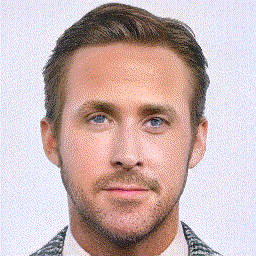

In [ ]:
# Display the git and observe the morphing operation
IPython.display.Image(open(output_dir,'rb').read())

### Style Transfer 

For transfering the style of a generated image to another one, I use the crossover operation of [StyleGANv1](https://arxiv.org/abs/1812.04948).

In this crossover operation, I take the corresponding latent codes of bot embedding images $w_1$ and $w_2$. Then, to control the style $w_1$ is applied before the crossover point and $w_2$ after it. This  regular-ization technique prevents the network from assuming that adjacent styles are correlated.

In [ ]:
!ls stuff/results/synthetic_images/latents

expression01_latents_iters_002000_step_0100.npz
expression02_latents_iters_002000_step_0100.npz
sample03_latents_iters_000100_step_0010.npz
sample03_latents_iters_001500_step_0100.npz
sample03_latents_iters_002000_step_0100.npz
sample03_latents_iters_012000_step_0500.npz
sample05_latents_iters_001500_step_0100.npz
sample05_latents_iters_005000_step_0100.npz
sample06_latents_iters_025000_step_0100.npz
sample08_latents_iters_005000_step_0100.npz
sample08_latents_iters_015000_step_0100.npz
sample08_latents_iters_020000_step_0100.npz


Getting latent idx: 12000
Getting latent idx: 20000
tensor([[-0.7358,  1.4036,  1.6383, -0.2892,  0.6240]], device='cuda:0')
tensor([[-0.1678, -1.4162,  0.3127,  0.3026,  0.7010]], device='cuda:0')
tensor([[-0.7358,  1.4036,  1.6383, -0.2892,  0.6240]], device='cuda:0')


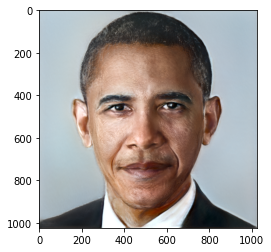

In [ ]:
CROSS_POINT = 2

# Dir to saving the results
SAVING_DIR = 'stuff/results/morphing/'

# Input Files
npz_base = "sample03_latents_iters_012000_step_0500.npz"
npz_style = "sample08_latents_iters_020000_step_0100.npz"
result_name = npz_base.split("_")[0] + "_" + npz_style.split("_")[0]

folder_dir = os.path.join(SAVING_DIR, result_name)
if not os.path.exists(folder_dir):
  os.makedirs(folder_dir)

latent_base = load_latent(npz_base)   # get the last latent
latent_style =load_latent(npz_style)  # get the last latent

latent_base = torch.tensor(latent_base).to(DEVICE)
latent_style = torch.tensor(latent_style).to(DEVICE)

print(latent_base[:,9,-5:])
print(latent_style[:,9,-5:])

latent_result = latent_base.clone().detach()
latent_result[:,-CROSS_POINT:,:] = latent_style[:,-CROSS_POINT:,:]
print(latent_result[:,9,-5:])

# Generate the synthetic image
synth_img = G.synthesis(latent_result, noise_mode='const', force_fp32=True)
synth_img = (synth_img + 1.0) / 2.0
synth_img = synth_img.clamp(0,1)

plt.imshow(synth_img.detach().to('cpu').squeeze(0).permute(1, 2, 0))

# Save the generated image
#file_dir = os.path.join(SAVING_DIR, "{}/{}.png".format(result_name,str(i).zfill(4)))
#print("Saving: {}".format(file_dir))
#save_image(synth_img.clamp(0,1),file_dir)


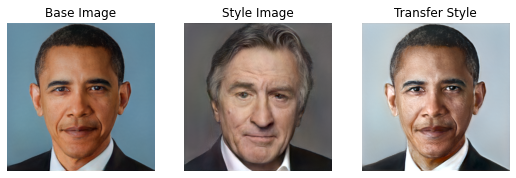

In [ ]:
plot_latents([latent_base, latent_style, latent_result], ["Base Image", "Style Image", "Transfer Style"])

## Expression Transfer and Face Reenactment

Given three input vectors $w1$, $w2$, $w3$, expression transfer is computed as 
$$w = w1 + \lambda(w3−w2)$$, where $w1$ is the latent code of the target image, $w2$ corresponds to a neutral expression of the source image, and $w3$ corresponds to a more distinct expression.

In [ ]:
def applied_norm2(difference, threshold):
  result = difference.clone().detach()
  for i in range(difference.size()[2]):
    norm = torch.linalg.norm(result[:,:,i])
    if norm < threshold:
      print("Channel to zero")
      result[:,:,i] = torch.zeros(18)

  for i in range(difference.size()[1]):
    norm = torch.linalg.norm(result[:,i,:])
    result[:,i,:] = result[:,i,:] / norm

  return result
      

In [ ]:
# Dir to saving the results
SAVING_DIR = 'stuff/results/expression_transfer/'

# Input Files
npz_file1 = "sample03_latents_iters_012000_step_0500.npz"
npz_file2 = "expression01_latents_iters_002000_step_0100.npz"
npz_file3 = "expression02_latents_iters_002000_step_0100.npz"

result_name = npz_file1.split("_")[0] \
        + "_" + npz_file2.split("_")[0] \
        + "_" + npz_file3.split("_")[0]

folder_dir = os.path.join(SAVING_DIR, result_name)
if not os.path.exists(folder_dir):
  os.makedirs(folder_dir)

w_1=load_latent(npz_file1) # get the last latent
w_2=load_latent(npz_file2) # get the last latent
w_3=load_latent(npz_file3) # get the last latent

w_1=torch.tensor(w_1).to(DEVICE)
w_2=torch.tensor(w_2).to(DEVICE)
w_3=torch.tensor(w_3).to(DEVICE)

mu = 2
std = 0.5
threshold = 1

diff = applied_norm2(w_3 - w_2, threshold)
for i in range(100):
    alpha = (1/100)*i    
    w = w_1 + alpha * diff

    # Generate the synthetic image
    synth_img = G.synthesis(w, noise_mode='const', force_fp32=True)
    synth_img = (synth_img + 1.0) / 2.0

    # Save the generated image
    file_dir = os.path.join(SAVING_DIR, "{}/{}.png".format(result_name,str(i).zfill(4)))
    #print("Saving: {}".format(file_dir))
    save_image(synth_img.clamp(0,1),file_dir)


Getting latent idx: 12000
Getting latent idx: 2000
Getting latent idx: 2000
Channel to zero
Channel to zero
Channel to zero
Channel to zero


In [ ]:
input_dir = os.path.join(SAVING_DIR, result_name)
output_dir = os.path.join(SAVING_DIR, result_name +".gif")
make_gif(input_dir, output_dir)

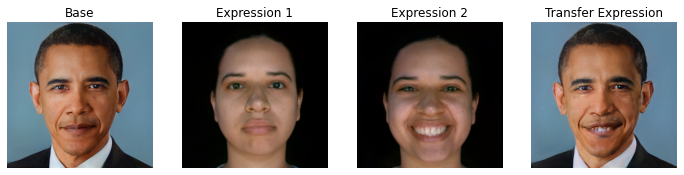

In [ ]:
plot_latents([w_1, w_2, w_3, w], ["Base", "Expression 1", "Expression 2", "Transfer Expression"])

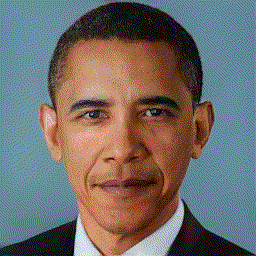

In [ ]:
# Display the gif and observe the expression transfer
IPython.display.Image(open(output_dir,'rb').read())